In [20]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import json
from concurrent.futures import ThreadPoolExecutor, as_completed
import plotly.graph_objects as go
import cv2
from tqdm.notebook import tqdm
%matplotlib inline

(248, 250)

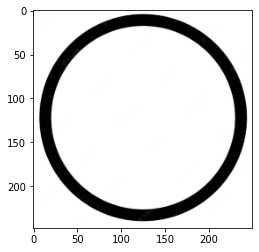

In [23]:
image = Image.open('img/circle.png')
pixel_size = 1 #reduzco complejidad
ancho, alto = image.size
nuevo_ancho = ancho // pixel_size
nuevo_alto = alto // pixel_size
imagen_pixelada = image.resize((nuevo_ancho, nuevo_alto), Image.NEAREST)
image = imagen_pixelada.convert('L')
imagen = np.array(image)
gaussian_kernel = 25
#imagen = cv2.GaussianBlur(imagen.copy(), (gaussian_kernel,gaussian_kernel), 0) #convoluciono por una gaussiana
plt.imshow(imagen,cmap='gray')
imagen.shape

# Filtros de Gabor

Visualicemos un filtro de gabor definido en $\mathbb{R}^2$: $$\begin{aligned} \Psi : \mathbb{R}^2 &\longrightarrow \mathbb{C} \\ \Psi(x,y) &\longmapsto e^{-(x^2+y^2)} e^{2iy} \end{aligned}$$

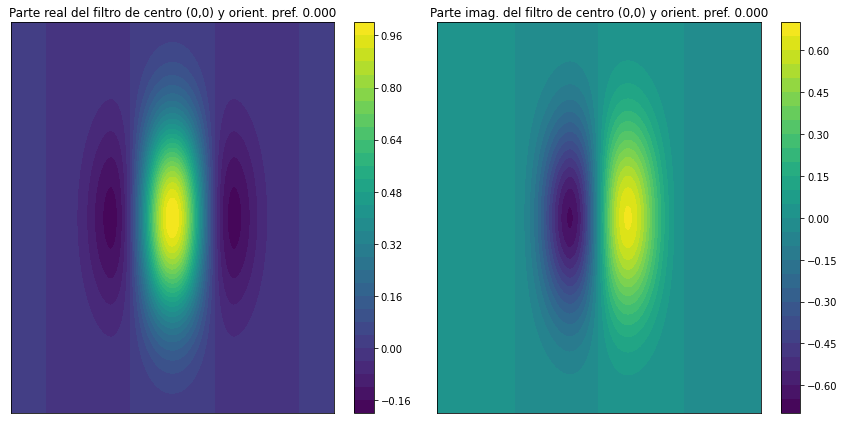

In [24]:
#Visualización de un filtro de gabor y rotación de la orientación preferida
def gabor(x,y,x0,y0,theta):
    return np.exp(-((x-x0)**2 + (y-y0)**2)) * np.exp(2j*(- np.sin(theta)*(x-x0) + np.cos(theta)*(y-y0)))

def plot_gabor(x0,y0,theta,plot3d=False):
    cmap = 'viridis'
    levels = 30

    #veamos un ejemplo
    x_gab = np.linspace(-4+x0,4+x0,1000)
    y_gab = np.linspace(-3+y0,3+y0,1000)

    X, Y = np.meshgrid(x_gab, y_gab)
    Z = gabor(X,Y,x0,y0,theta) #el ejemplo anterior

    fig = plt.figure(figsize=(12,6))
    ax1 = fig.add_subplot(1,2,1)
    c1 = ax1.contourf(Y, X, Z.real, cmap=cmap,levels=levels)
    ax1.set_title("Parte real del filtro de centro ({},{}) y orient. pref. {:.3f}".format(x0,y0,theta))
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax1.set_ylim(-2+y0,2+y0)
    plt.colorbar(c1,ax=ax1)

    ax2 = fig.add_subplot(1,2,2)
    c2 = ax2.contourf(Y, X, Z.imag, cmap=cmap,levels=levels)
    ax2.set_title('Parte imag. del filtro de centro ({},{}) y orient. pref. {:.3f}'.format(x0,y0,theta))
    ax2.set_xticks([])
    ax2.set_yticks([])
    ax2.set_ylim(-2+y0,2+y0)
    plt.colorbar(c2,ax=ax2)

    if plot3d:
        fig2 = plt.figure(figsize=(12,6))
        ax3 = fig2.add_subplot(1,1,1,projection='3d')
        ax3.plot_surface(Y,X,abs(Z),cmap=cmap)
        ax3.set_title("Módulo de un filtro de Gabor")

    plt.tight_layout()
    plt.show()

plot_gabor(0,0,0,False)

Veamos ahora el filtro centrado en el (1,1) y girado $\pi/4$

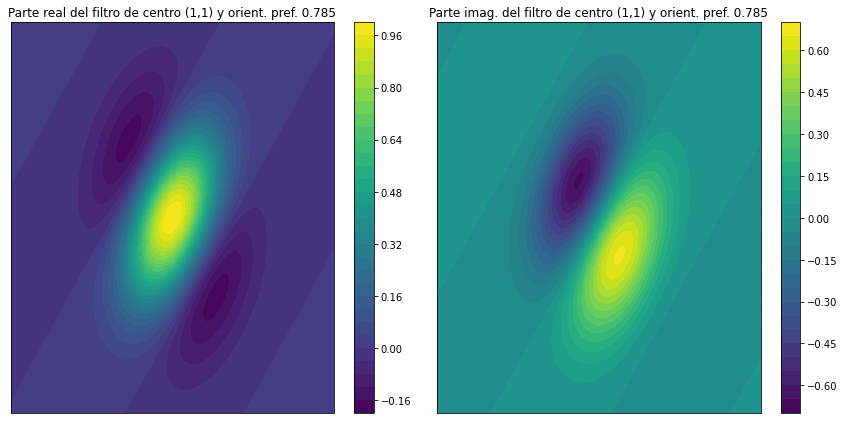

In [25]:
plot_gabor(1,1,np.pi/4)

# Fibrado

In [26]:
class GCell:
    def __init__(self):
        self.recprof = lambda posiciones : np.exp(-((posiciones[:,:,0])**2 + (posiciones[:,:,1])**2)) * np.exp(2j*(posiciones[:,:,1]))
        
# def Accion(posiciones,x,y,phi):
#     return np.add(np.matmul(posiciones,np.array([[np.cos(phi),-np.sin(phi)],[np.sin(phi),np.cos(phi)]])), np.array([x,y]))

def AccionInv(posiciones,x,y,phi):
    #devuelve el punto con la rotacion inversa y desplazado -
    return np.matmul((posiciones - np.array([x,y])), np.array([[np.cos(phi),np.sin(phi)],[-np.sin(phi),np.cos(phi)]]))

def O(x,y,phi,imagen,gcell,posiciones):
    return np.sum(imagen * (gcell.recprof(posiciones)))

# class V1:
#     def __init__(self, height, width, imagen):
#         #inicio un tablero con las células ganglionares bajo la acción del grupo E(2), rotaciones y traslaciones en el plano
#         #imagen: 
#         self.n = imagen.shape[0]
#         #posiciones es una discretacizacion del plano por puntos con coordenadas (i,j) habrá que crear células ganglionales con distintas posiciones
#         posiciones = np.array(list(product(np.arange(1,self.n+1),repeat=2))).reshape((self.n,self.n,2))
#         self.reticulo = None
#         pass

def searchPhiP(x,y,imagen,gcell):
    posiciones = np.argwhere(np.ones_like(imagen)).reshape((*np.ones_like(imagen).shape,2))
    
    espacioBusqueda = np.linspace(0,np.pi,60) #las fibras son S1 pero modulo pi

    return (espacioBusqueda[np.argmax(np.fromiter([np.abs(O(x,y,phi,imagen,gcell,AccionInv(posiciones,x,y,phi))) for phi in espacioBusqueda],dtype=np.float16))],x,y)

def allPhiP(imagen,gcell,startFromSomewhere=False):
    #startFromSomewhere: True retomo cálculo desde el json resultados/preferredOrientation_it, False desde cero
    arr = np.argwhere(np.ones_like(imagen)).reshape((*np.ones_like(imagen).shape,2)).reshape(-1, *np.argwhere(np.ones_like(imagen)).reshape((*np.ones_like(imagen).shape,2)).shape[2:])
    if not startFromSomewhere:
        prefdOr = {(x,y):None for x,y in arr}
    else:
        #retomamos el cálculo desde otro punto
        with open('resultados/preferredOrientation_it.json') as file:
            aux = json.load(file)
        mydict2 = {eval(k):v for k,v in aux.items()}
        prefdOr = mydict2 #este diccionario contiene Nones, voy a eliminar de arr aquellos cálculos que ya he hecho
        arr = np.array([t for t in arr if prefdOr[(t[0],t[1])] == None])
        
    total = arr.shape[0]
    update = 0
    division5porciento = int(total * 0.05) #saco paquetes de 5% del total
    
    print("Saving data in resultados/preferredOrientation_it.json")
    with tqdm(total=total) as progressB:
        with ThreadPoolExecutor() as executor:
            resultados = [executor.submit(lambda args : searchPhiP(imagen=imagen, gcell=gcell,**{'x':args[0], 'y':args[1]}), tup) for tup in arr]
            for future in as_completed(resultados):
                res, x, y = future.result()
                prefdOr[(x,y)] = res
                
                progressB.update(1)
                
                #voy a actualizar el guardado del cálculo cada 5% del total
                if progressB.n == total or (division5porciento != 0 and progressB.n%division5porciento == 0):
                    update+=1
                    #guardo en resultados/nombre_json
                    with open(f'resultados/preferredOrientation_it.json', 'w') as file:
                        json.dump({str(k): v for k, v in prefdOr.items()}, file, indent=4)
                    if progressB.n != total: print(f"Data update nº{update}")
                    else: print(f"Final update")

    return prefdOr

def scatterDict(datos,image,plotProyection):
    x = np.array([coord[0] for coord in datos.keys()])
    y = np.array([coord[1] for coord in datos.keys()])
    z = np.array(list(datos.values()))
    
    mycmap = 'viridis'
    
    fig = plt.figure(figsize=(20, 20))
    ax1 = fig.add_subplot(1, 2, 1)
    scatter1 = ax1.scatter(y, -x, c=z, cmap=mycmap) #invierto, si no sale al reves
    ax1.set_aspect('equal')
    ax1.set_xlabel('Eje X')
    ax1.set_ylabel('Eje Y')
    ax1.set_title('Orientación preferida para cada punto en la imagen')
    fig.colorbar(scatter1, ax=ax1, label='Orientación preferida [0,pi]',fraction=0.046, pad=0.04)
    
    ax2 = fig.add_subplot(1, 2, 2, projection='3d')
    if plotProyection:
        z_ = np.zeros(np.array(list(datos.values())).shape) #sirve para visualizar la proyección de los puntos
        scatter2 = ax2.scatter(x, y, z_, c=z, cmap=mycmap)  # El color de los puntos se basa en los valores de z
    else:
        scatter2 = ax2.scatter(x, y, z, c=z, cmap=mycmap)  # El color de los puntos se basa en los valores de z
    ax2.set_xlabel('Eje X')
    ax2.set_ylabel('Eje Y')
    ax2.set_zlabel('PhiP')
    ax2.set_title('Orientación preferida para cada punto en la imagen')
    fig.colorbar(scatter2, ax=ax2, label='Altura = PhiP',fraction=0.046, pad=0.04)
    plt.tight_layout()
    
    
    plt.show()
    
        
    fig2 = go.Figure(data=[go.Scatter3d(x=x, y=y, z=z, mode='markers',marker=dict(size=1,color=z, colorscale='Viridis'))])
    fig2.update_layout(scene=dict(
                        xaxis_title='X Label',
                        yaxis_title='Y Label',
                        zaxis_title='Altura preferida'))

    fig2.show()

In [ ]:
gcell = GCell()
%time mydict = allPhiP(imagen,gcell)
#mydict = allPhiP(imagen,gcell,True) #si datos guardados y retomar desde un punto

Saving data in resultados/preferredOrientation_it.json


  0%|          | 0/62000 [00:00<?, ?it/s]

Data update nº1
Data update nº2
Data update nº3
Data update nº4
Data update nº5
Data update nº6


from IPython.display import display, Javascript
display(Javascript('alert("La ejecución de la celda ha finalizado.")'))

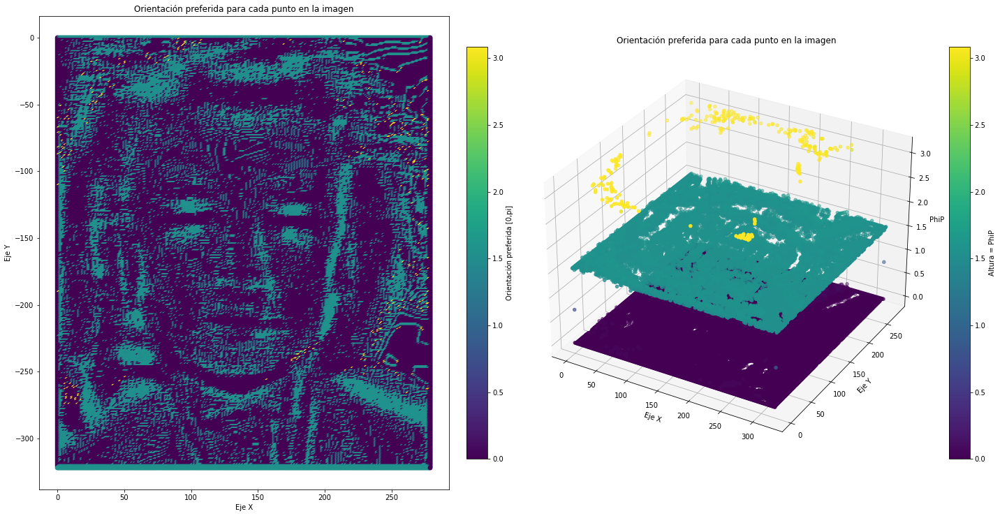

In [15]:
scatterDict(mydict,imagen,False) #si la tercera figura no carga, refrescar notebook

# Funciones para cargar/guardar los cálculos guardados en formato json

In [8]:
def save(ruta):
    #save
    with open(ruta, 'w') as file:
        json.dump({str(k): v for k, v in mydict.items()}, file, indent=4)

def load(ruta):
    #load
    with open(ruta) as file:
        aux = json.load(file)
    return {eval(k):v for k,v in aux.items()}

In [9]:
#save, descomentar para usar
# nombre = 'maryeinst'
# save("safeCalcs/{}.json".format(nombre))

In [14]:
#load, descomentar para usar
nombre = 'maryeinst'
mydict = load("safeCalcs/{}.json".format(nombre))

# ''Limpio'' el fibrado con los contornos

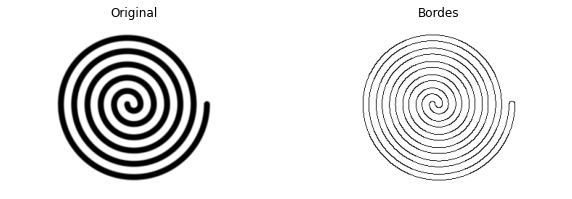

In [13]:
#saco los puntos que perteneces al borde
bordes = cv2.Canny(imagen.copy(), 0, 10)

plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
plt.imshow(imagen, cmap='gray')
plt.title('Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(bordes, cmap='binary')
plt.title('Bordes')
plt.axis('off')

plt.show()

# Elevación de curvas al fibrado (discretizado)

Voy a intentar elevar las curvas al fibrado

Problemas:
   
- 1 Los puntos del contorno en la variable bordes NO esta ordenado, en el sentido que, los puntos del borde sí están representados, pero no están ordenados ``linealmente'' como para poder hacer interpolación directa de los puntos a partir de la matriz.

In [14]:
def plot_in_fibration(mydict, imagen, addLines=False, addPoints=False, addInitial=False, addGaussianBlurr=False):
    
    #Hago la convolución con una gaussiana
    gaussifyed_image = cv2.GaussianBlur(imagen.copy(), (3,3), 2)
    
    # obtengo los puntos de la curva (bordes), en forma de indexado de puntos pixeles (x,y)
    if addGaussianBlurr : 
        bordes = cv2.Canny(gaussifyed_image.copy(), 0, 10)
    else:
        bordes = cv2.Canny(imagen.copy(), 0, 10)
    
    #extraemos contornos (nos devuelve un orden apropiado para hacer el plot go)
    (contornos, _) = cv2.findContours(bordes.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    #conts = cv2.drawContours(imagen.copy(),contornos,-1,(0,0,255), 2)

    fig = go.Figure(layout=dict(width=1000, height=1000))
    
    if addLines:
        for contorno in contornos:
            #cuando hacemos el findcontours puede haber varias componentes conexas
            contorno = contorno.reshape((contorno.shape[0],2))
            xe = contorno[:,1] #findcontours invierte las componentes
            ye = contorno[:,0]
            z = np.array([mydict[(i[1],i[0])] for i in contorno]) #invierte las componentes
            fig.add_trace(go.Scatter3d(x=xe, y=ye, z=z, mode='lines+markers', marker=dict(size=1,color=z,colorscale='Viridis'), line=dict(color=z,colorscale='Viridis', width=2)))

    
    #creo una matriz con todos los índices apuntando a pixeles de la imagen de los bordes
    indices_bordes = np.argwhere(np.ones_like(bordes)).reshape((*np.ones_like(bordes).shape,2))

    #tengo que hacer reshape a lo anterior para que sea una de tamaño 100,2
    indices_bordes = indices_bordes.reshape(-1, *np.argwhere(np.ones_like(imagen)).reshape((*np.ones_like(imagen).shape,2)).shape[2:])

    # ya tengo los índices de los puntos del borde de la imagen, ahora busco en mi diccionario mydict, y los subo al fibrado (creando otro diccionario)
    dic_bordes_fibrado = {(k[0],k[1]): mydict[(k[0],k[1])] if (bordes[(k[0],k[1])] == 255) else 0 for k in indices_bordes}

    #saco los puntos(indices) que pertenecen a un borde
    puntos_bordes_altura = {k:v for k,v in dic_bordes_fibrado.items() if dic_bordes_fibrado[k] != 0} #me quedo con los items quetengan altura
    puntos_cv = np.array([i for i in dic_bordes_fibrado.keys() if bordes[i[0],i[1]]!=0]) #puntos reales del borde 2D


    #saco los puntos 2D y la altura z
    puntos_bordes_2D = np.array(list(puntos_bordes_altura.keys()))
    z = np.array(list(puntos_bordes_altura.values()))

    #separo los x e y de puntos_bordes_2D
    x,y = puntos_bordes_2D[:,0], puntos_bordes_2D[:,1]
    
    if addPoints:
        fig.add_trace(go.Scatter3d(x=x, y=y, z=z, mode='markers', marker=dict(size=2,color=z,colorscale='Viridis'), name='Datos originales'))
    
    if addInitial:
        fig.add_trace(go.Scatter3d(x=puntos_cv[:,0].ravel(), y=puntos_cv[:,1].ravel(), z=np.zeros(puntos_cv[:,1].ravel().size), mode='markers', marker=dict(size=1,color='red'), name='Original'))

    fig.update_layout(scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Altura Preferida'))
    fig.show()

In [16]:
plot_in_fibration(mydict,imagen,True,True,True,True)